# GPUParticles — Trajectory Visualisation

This notebook demonstrates the `BDTrajectory` class, the Python interface
for HDF5 trajectory files produced by the Brownian-dynamics simulation engine.

Sections:
1. [Loading a trajectory](#1.-Loading-a-trajectory)
2. [Simulation parameters](#2.-Simulation-parameters)
3. [Accessing raw position data](#3.-Accessing-raw-position-data)
4. [Single-frame snapshot](#4.-Single-frame-snapshot)
5. [Customising the plot](#5.-Customising-the-plot)
6. [Grid of frames](#6.-Grid-of-frames)
7. [Animation](#7.-Animation)
8. [Mean-squared displacement](#8.-Mean-squared-displacement)

In [15]:
%reload_ext autoreload
%autoreload 2

import sys
from pathlib import Path

# bdtrajectory.py lives in the same directory as this notebook.
sys.path.insert(0, str(Path.cwd()))

import numpy as np
import matplotlib.pyplot as plt
from bdtrajectory import BDTrajectory

%matplotlib inline
plt.rcParams.update({'figure.dpi': 250})

## 1. Loading a trajectory

Pass the path to any `.h5` file written by the simulation engine.
The constructor reads the root-group attributes (simulation parameters)
and indexes all frame groups — no positions are loaded yet.

In [ ]:
TRAJ_PATH = Path("..") / "output_local/trajectory_soft_spheres_T10000.h5"   # adjust if your file is elsewhere

traj = BDTrajectory(TRAJ_PATH)
print(traj)

BDTrajectory('trajectory_highPe_De0.5.h5', N=2000, frames=501, sigma=1.0, L=56.05, f0=59.1)


In [18]:
print(f"Frames      : {traj.num_frames}")
print(f"Particles   : {traj.N}")
print(f"sigma       : {traj.sigma}")
print(f"Box (Lx,Ly) : {traj.Lx:.4f} x {traj.Ly:.4f}")
print(f"Timestep dt : {traj.dt}")
print(f"Time span   : {traj.time(0):.4g}  →  {traj.time(-1):.4g}")

Frames      : 501
Particles   : 2000
sigma       : 1.0
Box (Lx,Ly) : 56.0499 x 56.0499
Timestep dt : 0.0
Time span   : 0  →  1000


## 2. Simulation parameters

`traj.params` returns all root-group attributes as a plain dict.

In [19]:
import pprint
pprint.pprint(traj.params)

{'C': 1e-08,
 'De': 100.0,
 'L': 56.049912163979286,
 'N': 2000,
 'Pe': 100.0,
 'R': 5.0,
 'abs_tol': 1e-06,
 'delta': 0.95,
 'dt_init': 0.02,
 'epsilon': 1.0,
 'f0': 59.137552937522884,
 'gamma': 1.0,
 'gamma_a': 5.0,
 'init_mode': 'lattice',
 'kT': 1e-08,
 'k_a': 0.029568776468761444,
 'output_dt': 2.0,
 'output_file': 'trajectory_highPe_De0.5.h5',
 'phi': 0.5,
 'potential': 'WCA',
 'rel_tol': 1e-06,
 'seed': 42,
 'sigma': 1.0,
 't_end': 1000.0,
 'tau_theta': 1.6909729103205726}


## 3. Accessing raw position data

`traj.positions(i)` returns an `(N, 2)` NumPy array for frame *i*.
Negative indices work like regular Python (`traj[-1]` = last frame).
The object is also iterable: `for fd in traj` yields `FrameData`
namedtuples with `.frame`, `.step`, `.time`, and `.positions`.

In [20]:
# Direct access by frame index
pos0 = traj.positions(0)
print(f"positions(0) shape : {pos0.shape}")
print(f"First 3 rows       :\n{pos0[:3]}")

# __getitem__ shorthand
pos_last = traj[-1]
print(f"\nLast frame step : {traj.step(-1)},  time : {traj.time(-1):.4g}")

positions(0) shape : (2000, 2)
First 3 rows       :
[[0.6227768  0.6227768 ]
 [1.86833041 0.6227768 ]
 [3.11388401 0.6227768 ]]

Last frame step : 50000,  time : 1000


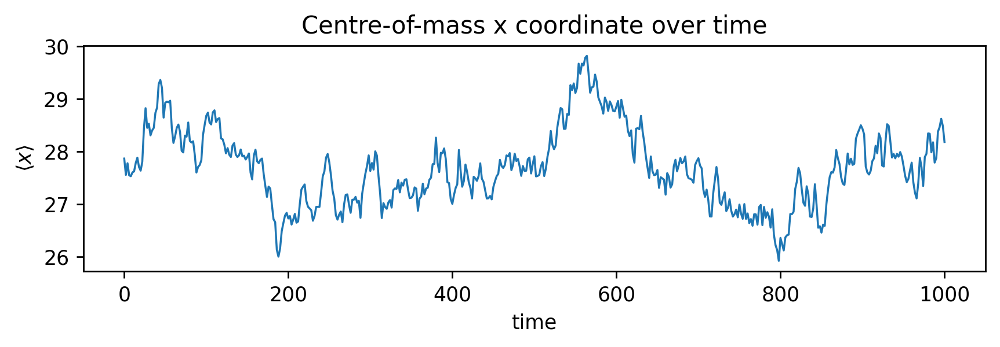

In [21]:
# Iteration: collect centre-of-mass over all frames
times = traj.all_times()
com_x = []
for fd in traj:
    com_x.append(fd.positions[:, 0].mean())

fig, ax = plt.subplots(figsize=(7, 2.5))
ax.plot(times, com_x, lw=1)
ax.set_xlabel("time")
ax.set_ylabel(r"$\langle x \rangle$")
ax.set_title("Centre-of-mass x coordinate over time")
plt.tight_layout()

## 4. Single-frame snapshot

`traj.plot_frame(i)` draws every particle as a `matplotlib.patches.Circle`
of radius `sigma/2`, then returns `(fig, ax)` for further customisation.

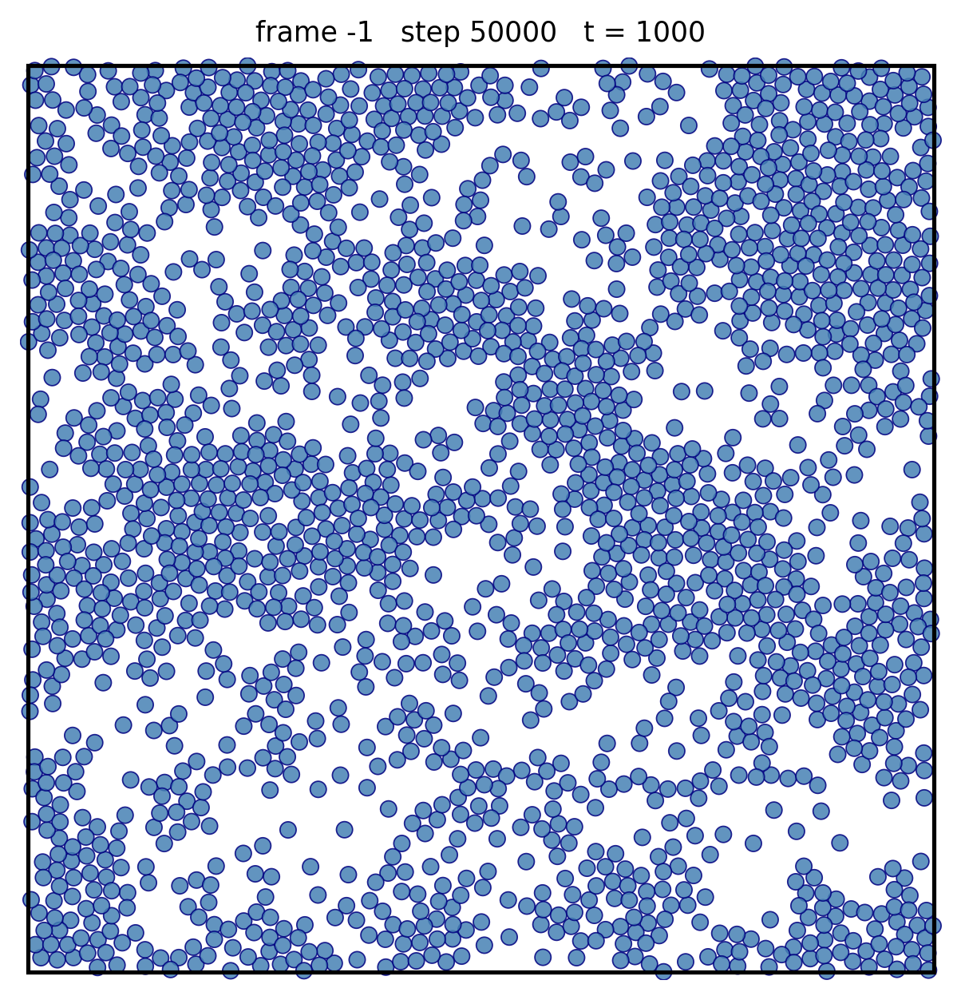

In [22]:
fig, ax = traj.plot_frame(-1)
plt.show()

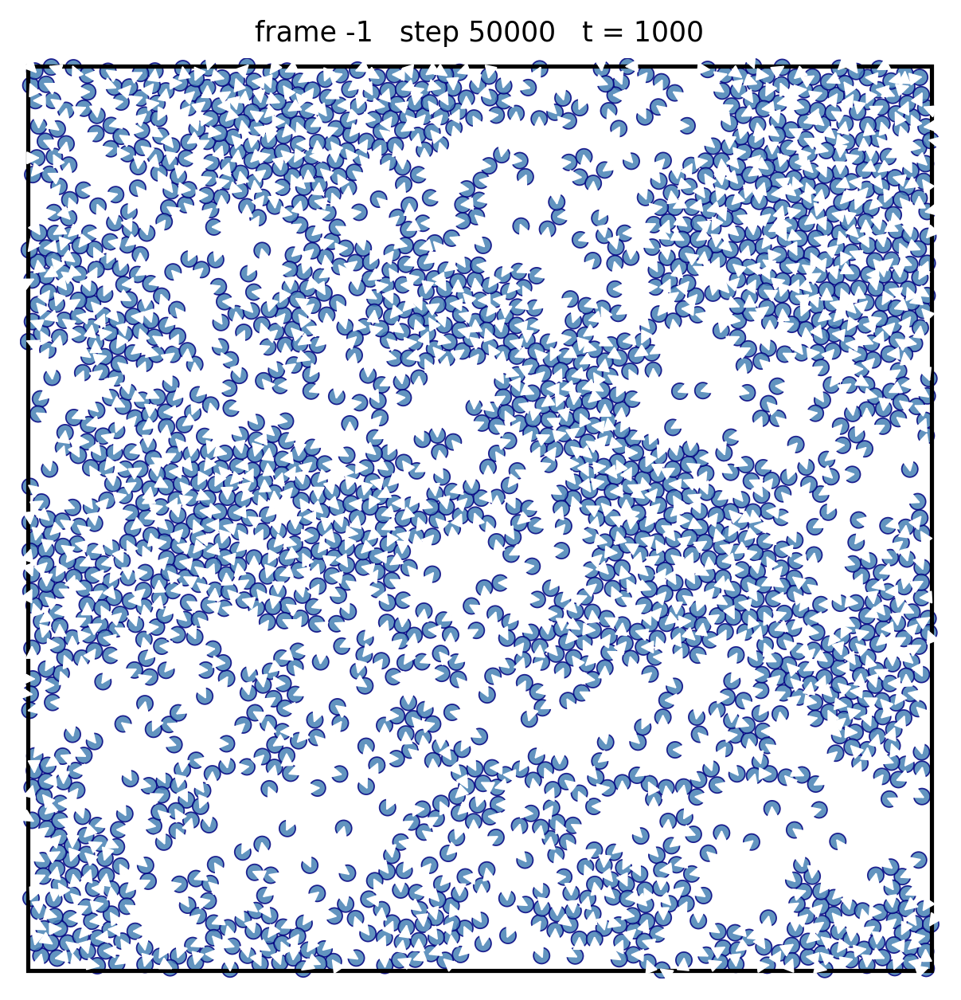

In [23]:
# Last frame: particles have diffused from their lattice starting positions.
fig, ax = traj.plot_frame(-1, show_orientations=True)
plt.show()

## 5. Customising the plot

All visual parameters are keyword arguments to `plot_frame`:

| argument | default | meaning |
|---|---|---|
| `particle_color` | `'steelblue'` | circle fill colour |
| `edgecolor` | `'navy'` | circle edge colour |
| `alpha` | `0.85` | opacity [0–1] |
| `linewidth` | `0.5` | edge line width (pts) |
| `show_box` | `True` | draw periodic-cell boundary |
| `box_color` | `'black'` | boundary colour |
| `box_linewidth` | `1.5` | boundary line width |
| `title` | auto | axes title string |
| `figsize` | `(6, 6)` | figure size in inches |
| `show_axes` | `False` | show axis ticks |

`plot_frame` also accepts an existing `ax` to embed into a larger figure.

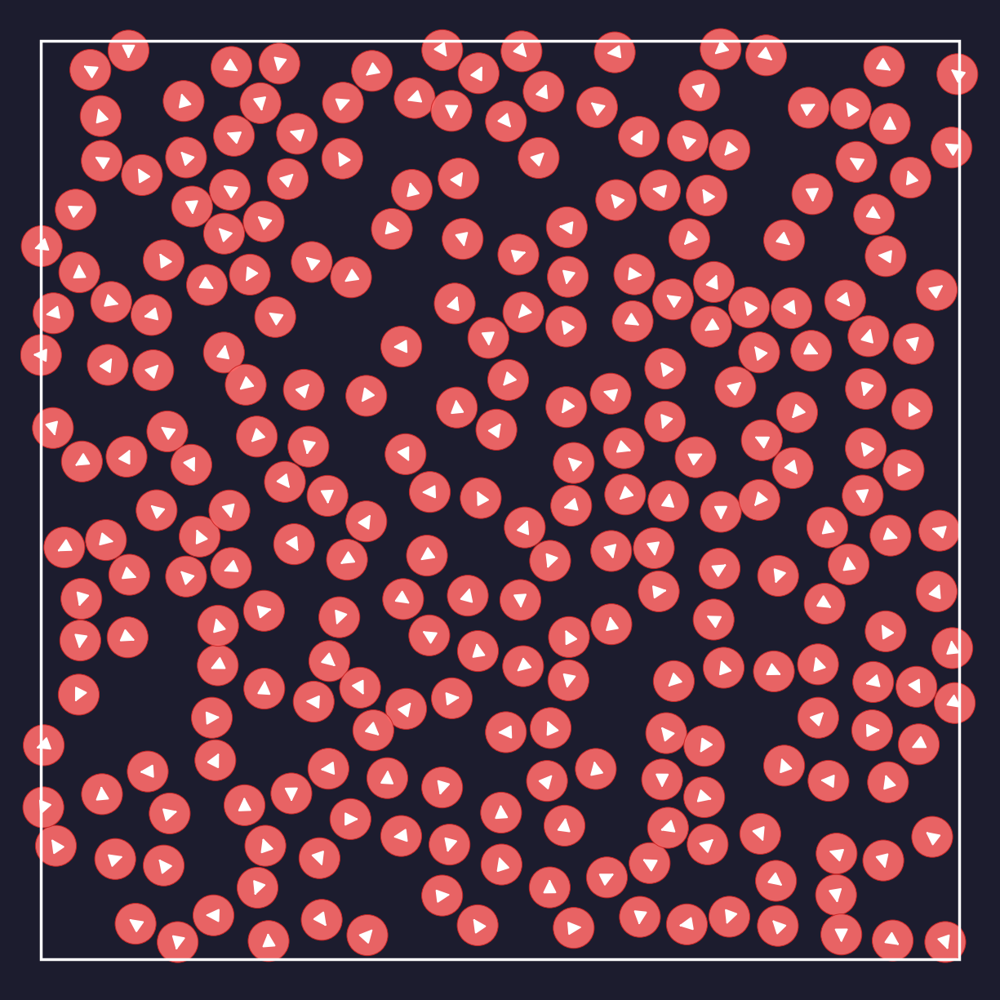

In [10]:
# Coral particles on a dark background
fig, ax = plt.subplots(figsize=(5, 5), facecolor='#1c1c2e')
ax.set_facecolor('#1c1c2e')

traj.plot_frame(
    frame_idx=50,
    ax=ax,
    particle_color='#ff6b6b',
    edgecolor='#cc2222',
    alpha=0.9,
    linewidth=0.3,
    box_color='white',
    box_linewidth=1.0,
    title='',
    show_orientations=True
)
plt.tight_layout()
plt.show()

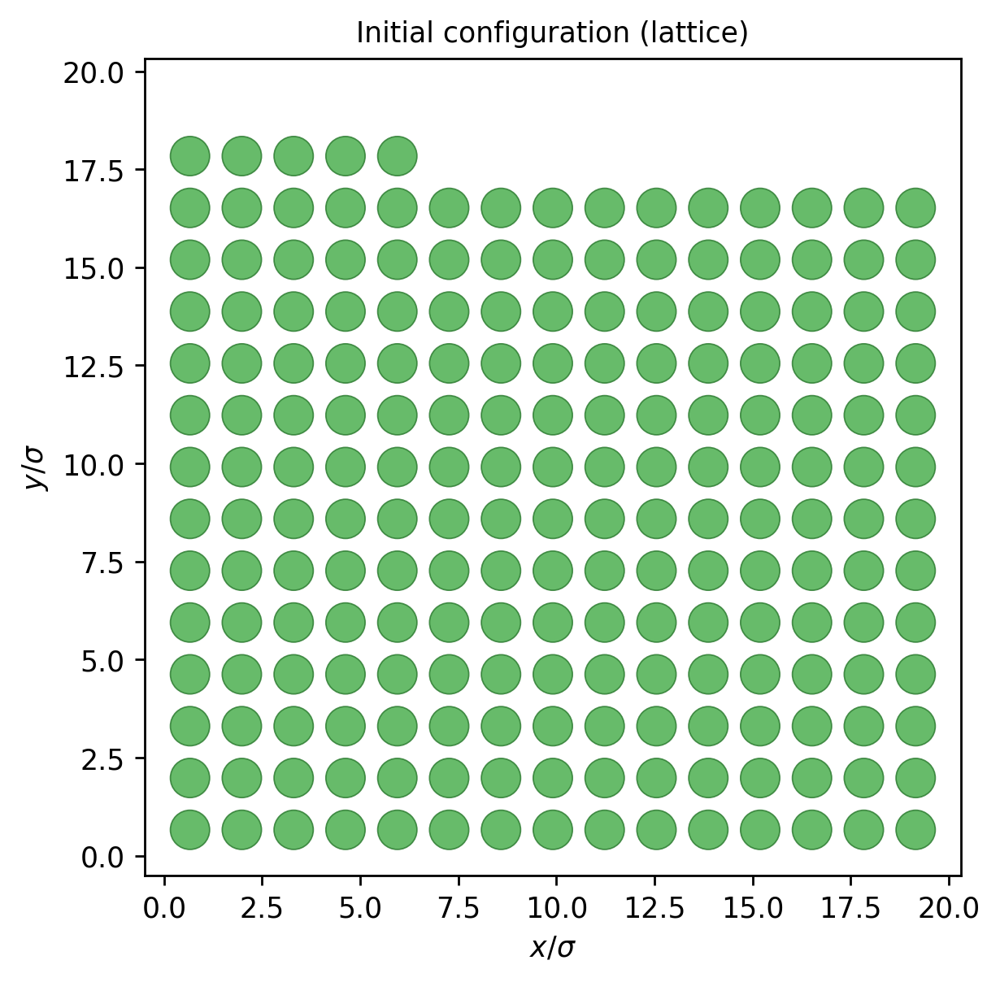

In [59]:
# Minimal style: no box, no title, show axis ticks for scale
fig, ax = traj.plot_frame(
    frame_idx=0,
    figsize=(5, 5),
    particle_color='#4caf50',
    edgecolor='#2e7d32',
    show_box=False,
    show_axes=True,
    title='Initial configuration (lattice)',
)
ax.set_xlabel(r'$x / \sigma$')
ax.set_ylabel(r'$y / \sigma$')
plt.tight_layout()
plt.show()

## 6. Grid of frames

`plot_frames_grid` tiles a set of frames into a grid.  All `plot_frame`
keyword arguments are forwarded through `**plot_frame_kwargs`.

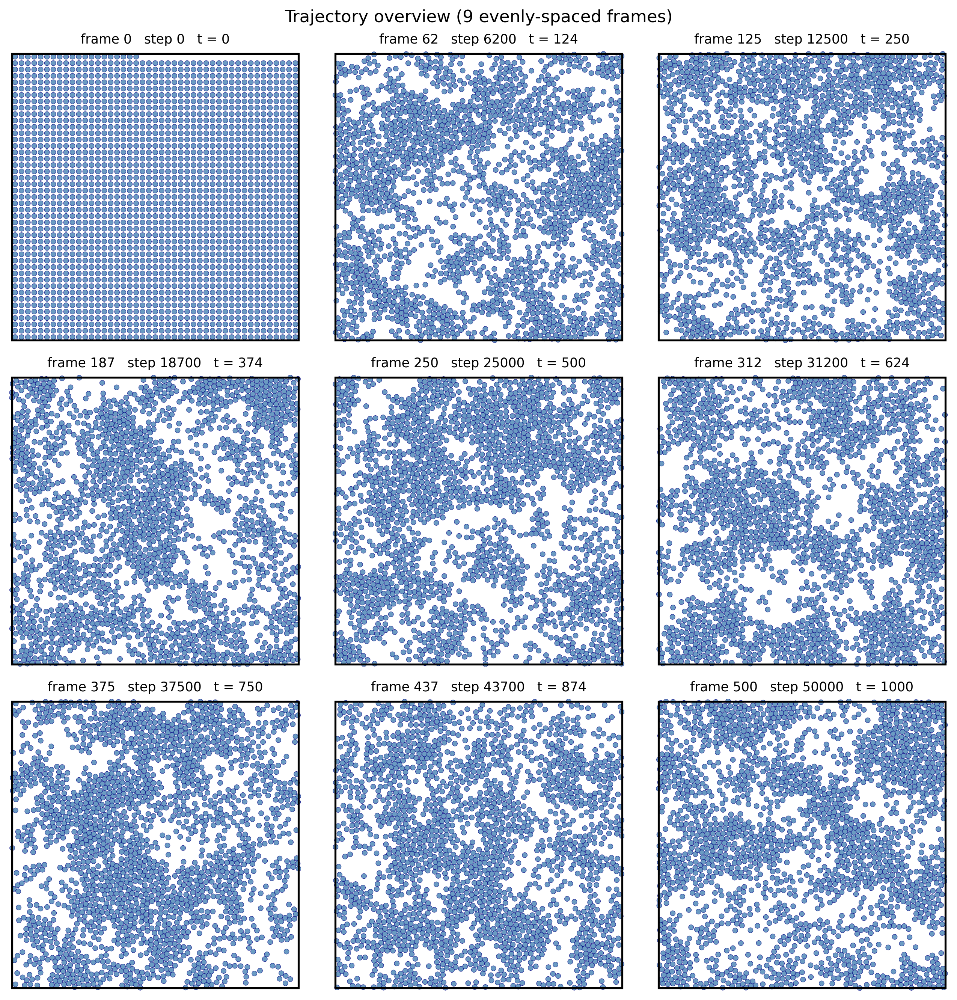

In [25]:
# Evenly-spaced 9-panel overview across the whole trajectory
fig, axes = traj.plot_frames_grid(
    ncols=3,
    subplot_size=3.5,
    particle_color='steelblue',
    edgecolor='navy',
    alpha=0.8,
    linewidth=0.3,
    show_orientations=False
)
fig.suptitle("Trajectory overview (9 evenly-spaced frames)", fontsize=13, y=1.01)
plt.show()

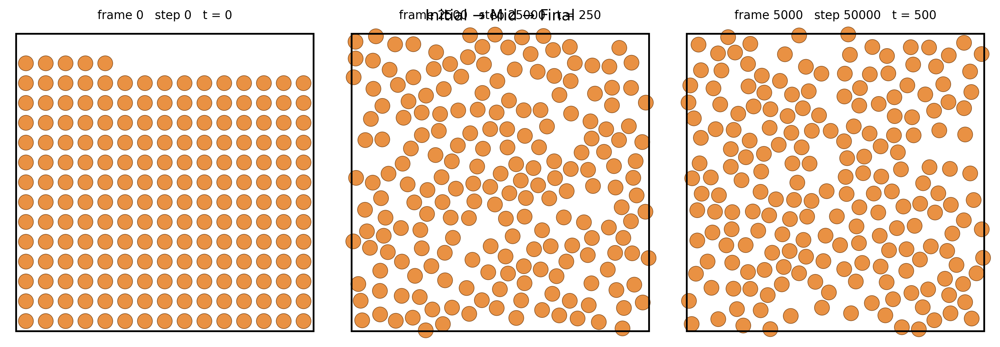

In [60]:
# Hand-pick frames: initial, halfway, final
mid = traj.num_frames // 2
fig, axes = traj.plot_frames_grid(
    frame_indices=[0, mid, traj.num_frames - 1],
    ncols=3,
    subplot_size=4.0,
    particle_color='#e67e22',
    edgecolor='#784212',
    alpha=0.85,
)
fig.suptitle("Initial → Mid → Final", fontsize=13, y=1.01)
plt.show()

## 7. Animation

`traj.animate()` returns a `FuncAnimation` that sweeps through the
trajectory.  In Jupyter, display it inline with `to_jshtml()`.

Animation size has reached 21362246 bytes, exceeding the limit of 20971520.0. If you're sure you want a larger animation embedded, set the animation.embed_limit rc parameter to a larger value (in MB). This and further frames will be dropped.


KeyboardInterrupt: 

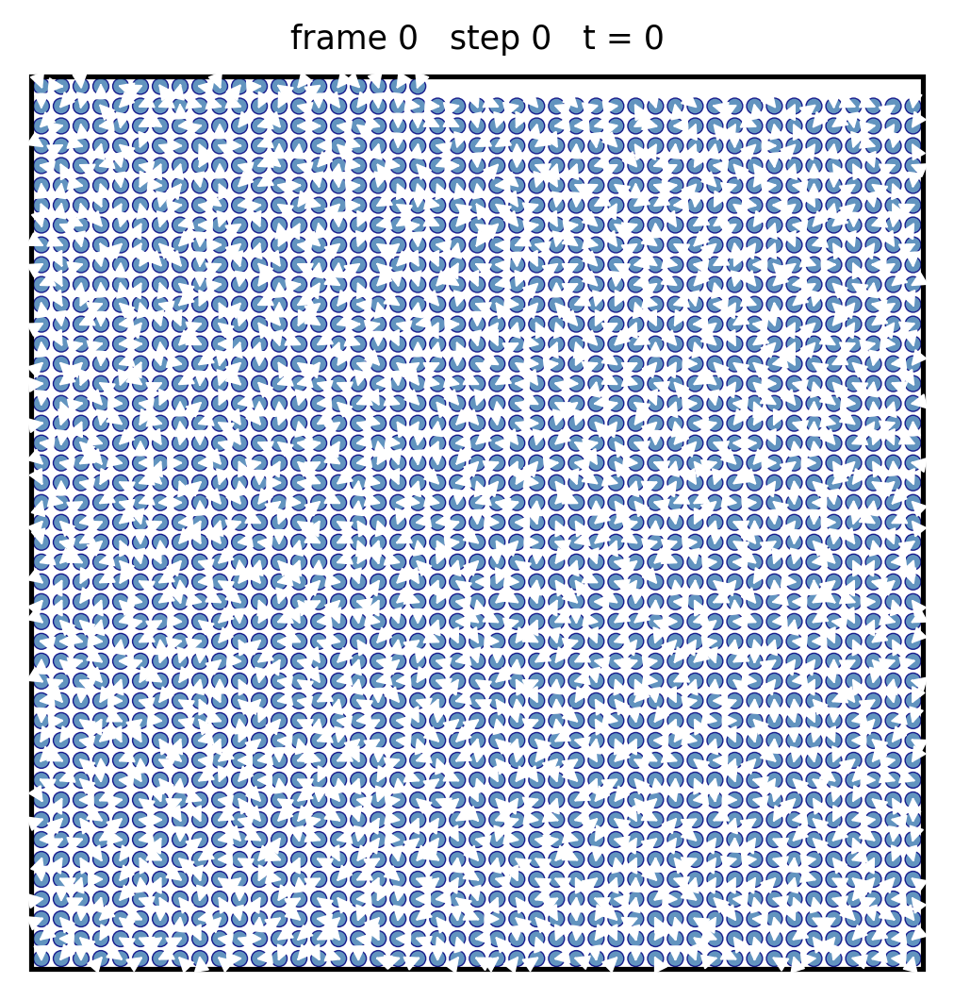

In [26]:
from IPython.display import HTML

# Animate every 5th frame to keep the notebook lightweight
# stride = max(1, traj.num_frames // 40)
stride = 1
indices = list(range(0, traj.num_frames, stride))

anim = traj.animate(
    frame_indices=indices,
    interval=20,
    figsize=(5, 5),
    particle_color='steelblue',
    edgecolor='navy',
    alpha=0.85,
    linewidth=0.4,
    show_orientations=True
)

HTML(anim.to_jshtml())

In [ ]:
# Save a GIF (optional — comment out if ffmpeg / pillow is not installed)
# anim.save("trajectory.gif", writer="pillow", fps=20)

In [76]:
print(2.0 ** (1.0 / 6.0))

1.122462048309373


## 8. Mean-squared displacement

`traj.mean_squared_displacement()` computes the ensemble-averaged MSD
relative to a reference frame.  For a free Brownian system the expected
result is $\text{MSD}(t) = 4 D t$ in 2-D.

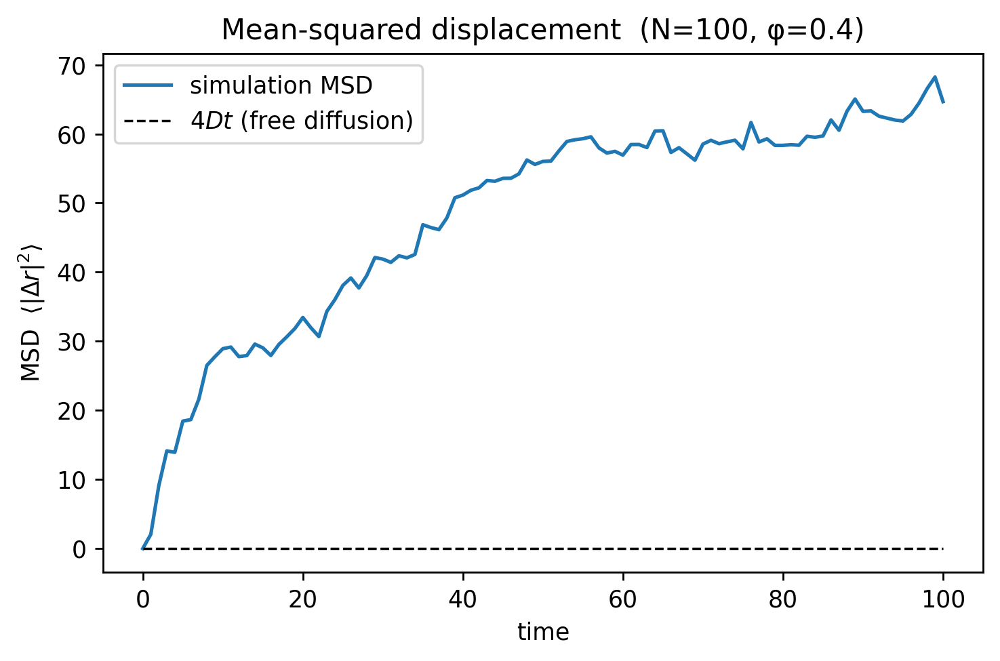

In [75]:
msd = traj.mean_squared_displacement(reference_frame=0)
times = traj.all_times()

# D = kT / gamma is derived from the input gamma (friction).
D   = traj.D
phi = traj.params['phi']

fig, ax = plt.subplots(figsize=(6, 4))
ax.plot(times, msd, lw=1.5, label='simulation MSD')
ax.plot(times, 4 * D * times, 'k--', lw=1, label=r'$4Dt$ (free diffusion)')

ax.set_xlabel('time')
ax.set_ylabel(r'MSD  $\langle |\Delta r|^2 \rangle$')
ax.set_title(f'Mean-squared displacement  (N={traj.N}, φ={phi})')
ax.legend()
plt.tight_layout()
plt.show()

The MSD rises more slowly than $4Dt$ at short times because the WCA repulsion
cage slows each particle; it approaches the free-diffusion limit only once
the cage rearranges.

In [33]:
# Close the file when done (the context-manager form does this automatically)
traj.close()